In [ ]:
!pip install opendatasets
import opendatasets as od
od.download("https://www.kaggle.com/datasets/sachchitkunichetty/rvf10k")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: arjunkawle
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/sachchitkunichetty/rvf10k


100%|██████████| 273M/273M [00:03<00:00, 82.8MB/s]

In [ ]:
import torch # Main PyTorch Library
from torch import nn # Used for creating the layers and loss function
from tqdm import tqdm
import torch.optim as optim
from torch.optim import Adam # Adam Optimizer
import torchvision.transforms as transforms # Transform function used to modify and preprocess all the images
from torchvision import models # import pretrained models in PyTorch library
from torch.utils.data import Dataset, DataLoader # Dataset class and DataLoader for creating the objects
from sklearn.preprocessing import LabelEncoder # Label Encoder to encode the classes from strings to numbers
import matplotlib.pyplot as plt # Used for visualizing the images and plotting the training progress
from torchvision.datasets import ImageFolder
from PIL import Image # Used to read the images from the directory
import pandas as pd # Used to read/create dataframes (csv) and process tabular data
import numpy as np # preprocessing and numerical/mathematical operations
import os # Used to read the images path from the directory

device = "cuda" if torch.cuda.is_available() else "cpu" # detect the GPU if any, if not use CPU, change cuda to mps if you have a mac


In [ ]:
# transformations
from torchvision.transforms import transforms

custom_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])

])

In [ ]:
class RealVsGenDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data = ImageFolder(data_dir, transform=transform)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx]

    @property
    def classes(self):
        return self.data.classes

In [ ]:
dataset = RealVsGenDataset(
    data_dir='/content/rvf10k/rvf10k/train'
)

In [ ]:
len(dataset)


7000

In [ ]:
data_dir = '/content/rvf10k/rvf10k/train'
target_to_class = {v: k for k, v in ImageFolder(data_dir).class_to_idx.items()}
print(target_to_class)

{0: 'fake', 1: 'real'}


In [ ]:
train_folder = '/content/rvf10k/rvf10k/train'
test_folder = '/content/rvf10k/rvf10k/valid'

train_dataset = RealVsGenDataset(train_folder, transform=custom_transform)
test_dataset =RealVsGenDataset(test_folder, transform=custom_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True,pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False,pin_memory=True)


In [ ]:
print("Train classes:", train_dataset.data.classes)
print("Train class_to_idx:", train_dataset.data.class_to_idx)

print("Test classes:", test_dataset.data.classes)
print("Test class_to_idx:", test_dataset.data.class_to_idx)


Train classes: ['fake', 'real']
Train class_to_idx: {'fake': 0, 'real': 1}
Test classes: ['fake', 'real']
Test class_to_idx: {'fake': 0, 'real': 1}


In [ ]:
vgg16 = models.vgg16(pretrained=True)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:02<00:00, 186MB/s]


In [ ]:
for param in vgg16.features.parameters():
  param.requires_grad=False

In [ ]:
vgg16.classifier = nn.Sequential(
    nn.Linear(25088, 1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 2)
)

In [ ]:
vgg16 = vgg16.to(device)

In [ ]:
learning_rate = 0.0001
epochs = 10


In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(vgg16.classifier.parameters(), lr=learning_rate)

In [ ]:
print("Torch CUDA available:", torch.cuda.is_available())
print("Device in use:", torch.device("cuda:0" if torch.cuda.is_available() else "cpu"))
if torch.cuda.is_available():
    print("GPU Name:", torch.cuda.get_device_name(0))

Torch CUDA available: True
Device in use: cuda:0
GPU Name: Tesla T4


In [ ]:
from tqdm import tqdm  # import tqdm

for epoch in range(epochs):
    total_epoch_loss = 0

    # wrap train_loader with tqdm
    for batch_features, batch_labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
        # move data to gpu
        batch_features, batch_labels = batch_features.to(device), batch_labels.to(device)

        # forward pass
        outputs = vgg16(batch_features)

        # calculate loss
        loss = criterion(outputs, batch_labels)

        # back pass
        optimizer.zero_grad()
        loss.backward()

        # update grads
        optimizer.step()

        total_epoch_loss += loss.item()

    avg_loss = total_epoch_loss / len(train_loader)
    print(f'Epoch: {epoch + 1} , Loss: {avg_loss}')


Epoch 1/10: 100%|██████████| 219/219 [00:53<00:00,  4.10it/s]


Epoch: 1 , Loss: 0.5196497237573475


Epoch 2/10: 100%|██████████| 219/219 [00:53<00:00,  4.11it/s]


Epoch: 2 , Loss: 0.30929067006258115


Epoch 3/10: 100%|██████████| 219/219 [00:54<00:00,  4.04it/s]


Epoch: 3 , Loss: 0.19335072506304202


Epoch 4/10: 100%|██████████| 219/219 [00:53<00:00,  4.07it/s]


Epoch: 4 , Loss: 0.11705055780130434


Epoch 5/10: 100%|██████████| 219/219 [00:54<00:00,  4.05it/s]


Epoch: 5 , Loss: 0.0754239933828921


Epoch 6/10: 100%|██████████| 219/219 [00:53<00:00,  4.08it/s]


Epoch: 6 , Loss: 0.05337971017683205


Epoch 7/10: 100%|██████████| 219/219 [00:54<00:00,  4.02it/s]


Epoch: 7 , Loss: 0.03913110082907407


Epoch 8/10: 100%|██████████| 219/219 [00:53<00:00,  4.06it/s]


Epoch: 8 , Loss: 0.02825944053995759


Epoch 9/10: 100%|██████████| 219/219 [00:54<00:00,  4.04it/s]


Epoch: 9 , Loss: 0.02849801792364491


Epoch 10/10: 100%|██████████| 219/219 [00:53<00:00,  4.07it/s]

Epoch: 10 , Loss: 0.03197385787035734


In [ ]:
vgg16.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
# evaluation on test data
vgg16.eval()
total = 0
correct = 0

with torch.no_grad():

  for batch_features, batch_labels in test_loader:

    # move data to gpu
    batch_features, batch_labels = batch_features.to(device), batch_labels.to(device)

    outputs = vgg16(batch_features)

    _, predicted = torch.max(outputs, 1)

    total = total + batch_labels.shape[0]

    correct = correct + (predicted == batch_labels).sum().item()

print(correct/total)
print(f"Accuracy: {100 * correct/total:.2f}%")


0.863
Accuracy: 86.30%


In [ ]:
import random
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import os

def evaluate_and_visualize(model, dataset_path, device, n_samples=10, batch_size=32):
    """
    Evaluate accuracy on validation set and visualize random samples without altering the images.
    Displays file names instead of full paths.
    """
    # Model input transform
    input_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]),

    ])

    # Dataset for model input
    test_dataset = RealVsGenDataset(dataset_path, transform=input_transform)
    test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # --- Compute overall accuracy ---
    model.eval()
    total, correct = 0, 0
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    acc = correct / total * 100
    print(f"Testing Accuracy: {acc:.2f}%")

    # --- Visualize random samples ---
    # List all images and labels from the folder structure
    all_image_paths = []
    all_labels = []
    for class_idx, class_name in enumerate(test_dataset.classes):
        class_folder = os.path.join(dataset_path, class_name)
        for img_name in os.listdir(class_folder):
            if img_name.lower().endswith(('.jpg', '.png', '.jpeg')):
                all_image_paths.append(os.path.join(class_folder, img_name))
                all_labels.append(class_idx)

    # Pick random samples
    indices = random.sample(range(len(all_image_paths)), min(n_samples, len(all_image_paths)))
    for idx in indices:
        img_path = all_image_paths[idx]
        label = all_labels[idx]

        # Load original image for plotting
        img = Image.open(img_path).convert("RGB")

        # Transform for model input
        img_tensor = input_transform(img).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(img_tensor)
            prob = F.softmax(output, dim=1)
            pred_class = torch.argmax(prob, 1).item()

        # Plot original image with file name
        file_name = os.path.basename(img_path)
        plt.imshow(img)
        plt.title(f"{file_name}\nPredicted: {test_dataset.classes[pred_class]}, Actual: {test_dataset.classes[label]}")
        plt.axis("off")
        plt.show()


Testing Accuracy: 86.30%


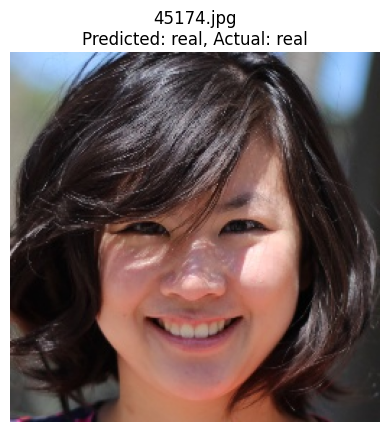

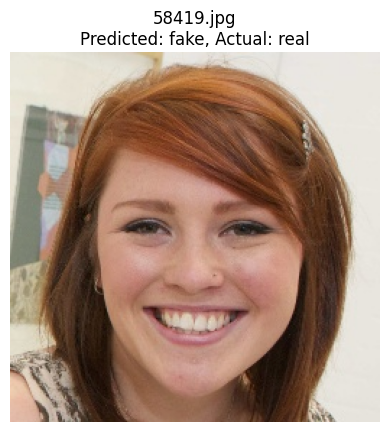

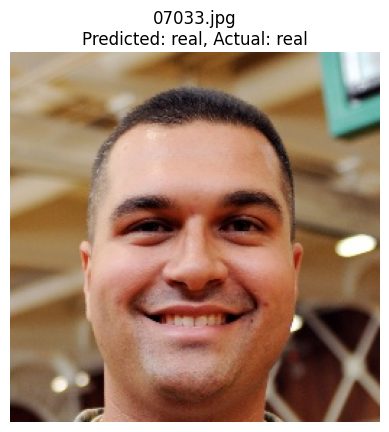

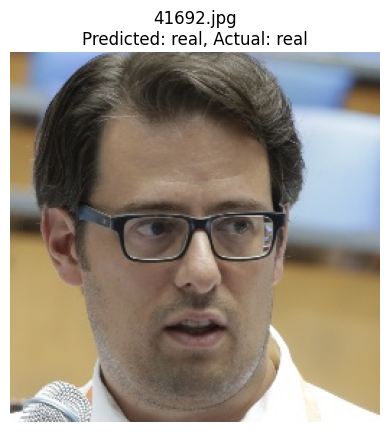

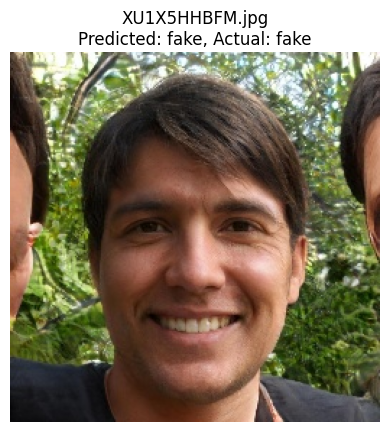

...

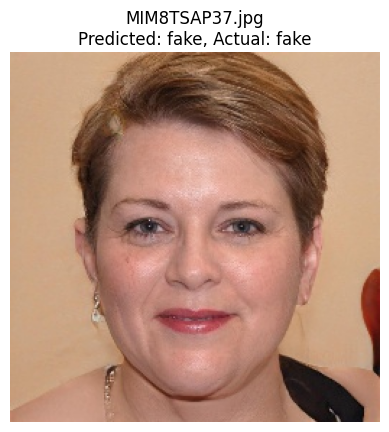

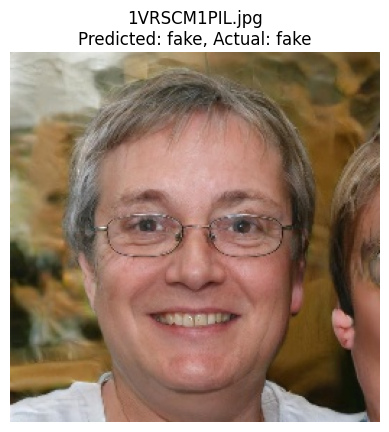

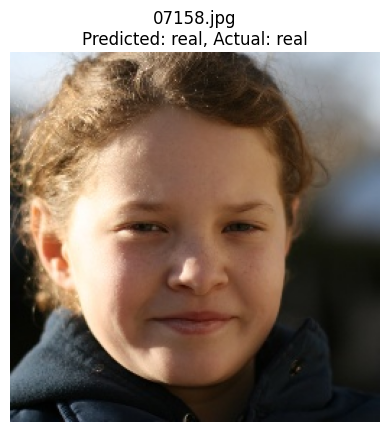

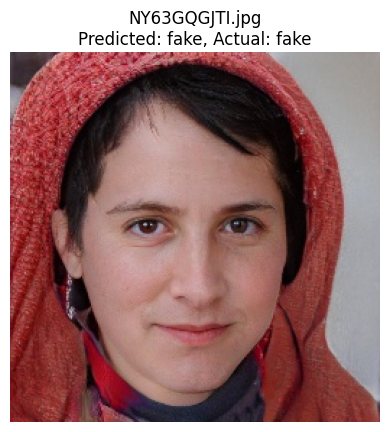

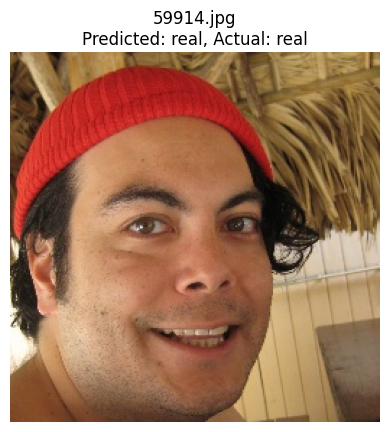

In [ ]:
test_folder = "/content/rvf10k/rvf10k/valid"
evaluate_and_visualize(vgg16, test_folder, device, n_samples=20)


In [ ]:
# Save trained model
torch.save(vgg16.state_dict(), "vgg16_RealVsFake.pth")
print("Model saved as vgg16_RealVsFake.pth")


Model saved as vgg16_RealVsFake.pth


In [ ]:
from torchvision import models
from torch import nn
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"

# Recreate architecture
vgg16 = models.vgg16(pretrained=True)

# Freeze feature extractor
for param in vgg16.features.parameters():
    param.requires_grad = False

# Define custom classifier (same as before!)
vgg16.classifier = nn.Sequential(
    nn.Linear(25088, 1024),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(1024, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 2)   # 2 classes: real vs fake
)

# Load trained weights
vgg16.load_state_dict(torch.load("/content/vgg16_RealVsFake.pth", map_location=device))
vgg16 = vgg16.to(device)
vgg16.eval()
print("Model loaded and ready for inference.")


Model loaded and ready for inference.


Testing Accuracy: 85.77%


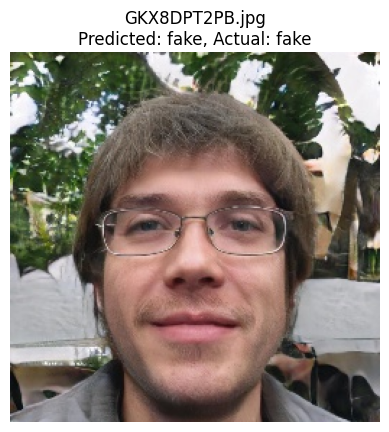

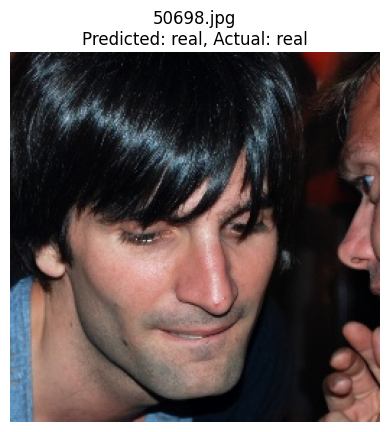

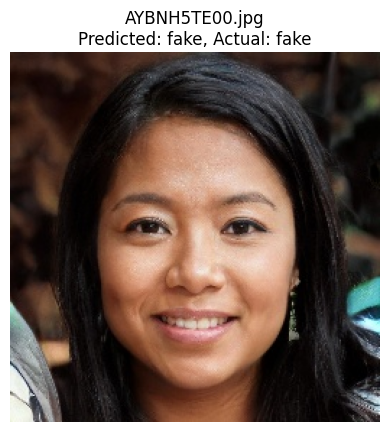

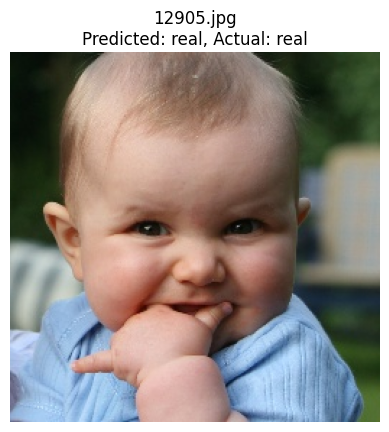

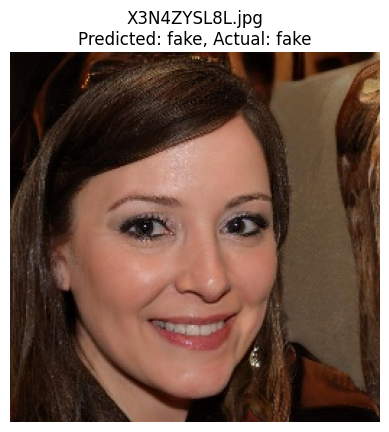

...

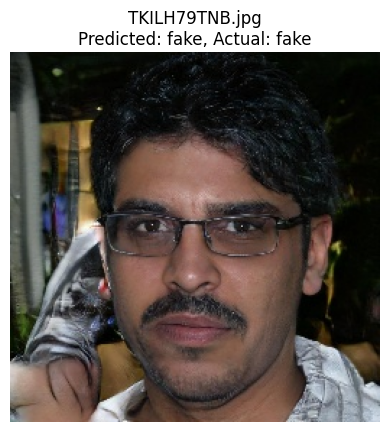

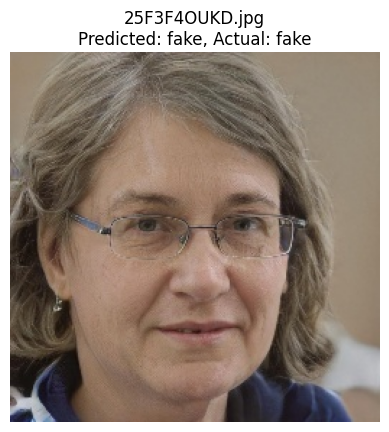

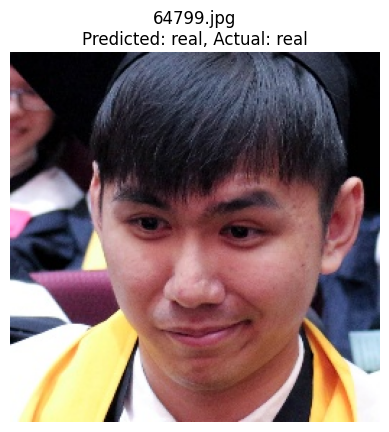

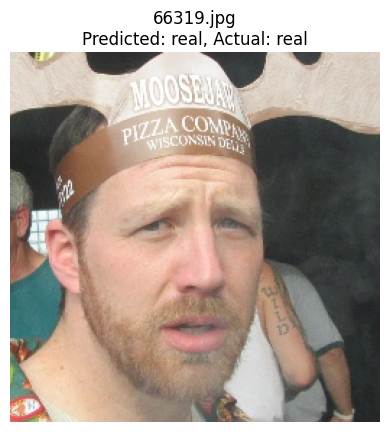

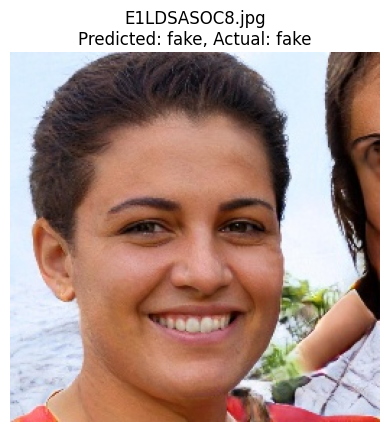

In [ ]:
test_folder = "/content/rvf10k/rvf10k/valid"
evaluate_and_visualize(vgg16, test_folder, device, n_samples=20)


In [ ]:
from google.colab import files


files.download("/content/vgg16_RealVsFake.pth")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>